## Vessel Traffic Example

Using moving pandas with the TransMAP REST API

In [2]:
# Source ref: https://github.com/anitagraser/movingpandas-examples/blob/main/analysis-examples/2-ship-data.ipynb

make_url = lambda uri: "https://oak.cast.uark.edu/{0}".format(uri)

In [1]:
%matplotlib inline

In [3]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [4]:
import requests
import numpy as np
import pandas as pd
import geopandas
from shapely.geometry import Point, LineString, Polygon
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
import movingpandas as mpd

import warnings
warnings.simplefilter("ignore")

In [5]:
mpd.__version__
def make_date(year: int, month: int, day: int, hour: int = 0, minute: int = 0, second: int = 0):
    return datetime(year, month, day, hour, minute, second).strftime("%Y-%m-%dT%H:%M:%S")


In [12]:
ais_data = requests.get(make_url('ais/vessels'), params={
    "limit": 50000,
    "start_date": make_date(2020, 5, 29),
    "end_date": make_date(2020, 5, 30)
})
ais_data.raise_for_status()

In [13]:
df = pd.DataFrame(ais_data.json())
df

,MMSI,BaseDateTime,LAT,LON,SOG,COG,Heading,VesselName,IMO,CallSign,VesselType,Status,Length,Width,Draft,Cargo,TranscieverClass,location
0,369330000,2020-05-29T00:00:00,29.13493,-90.20348,0.0,180.4,339.0,None,None,None,None,5.0,None,None,None,None,A,"[-90.20348, 29.13493]"
1,368076640,2020-05-29T00:00:00,29.60997,-84.58777,0.0,30.4,511.0,None,None,None,None,0.0,None,None,None,None,B,"[-84.58777, 29.60997]"
2,368043520,2020-05-29T00:00:00,27.88024,-97.27268,0.0,-80.6,244.0,None,None,None,None,0.0,None,None,None,None,B,"[-97.27268, 27.88024]"
3,367314740,2020-05-29T00:00:00,31.14192,-92.26107,1.2,-87.0,511.0,None,None,None,None,15.0,None,None,None,None,B,"[-92.26107, 31.14192]"
4,368926530,2020-05-29T00:00:00,29.82006,-91.54392,0.0,86.9,317.0,None,None,None,None,5.0,None,None,None,None,A,"[-91.54392, 29.82006]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,367653590,2020-05-29T00:07:49,38.28540,-122.28518,1.1,44.6,511.0,NOMATA,None,WDH7990,37.0,None,18.0,5.0,None,None,B,"[-122.28518, 38.2854]"
49996,366926740,2020-05-29T00:07:49,33.75942,-118.27430,0.4,21.7,102.0,TIM QUIGG,IMO8987917,WDB6570,31.0,0.0,24.0,9.0,4.0,52.0,B,"[-118.2743, 33.75942]"
49997,366978690,2020-05-29T00:07:49,37.71104,-122.80402,6.7,-172.6,240.0,EAGLE,IMO8661654,WBP2187,31.0,0.0,29.0,9.0,None,None,A,"[-122.80402, 37.71104]"
49998,368011470,2020-05-29T00:07:49,29.62379,-89.90540,1.9,144.2,511.0,LOUISE,None,WDJ7929,31.0,0.0,17.0,7.0,None,31.0,B,"[-89.9054, 29.62379]"


In [14]:
df2 = pd.DataFrame(df.location.tolist(), index= df.index)
gpdf = geopandas.GeoDataFrame(df, geometry=geopandas.points_from_xy(df2[0], df2[1]))

In [15]:
gpdf.set_crs('epsg:4326')

,MMSI,BaseDateTime,LAT,LON,SOG,COG,Heading,VesselName,IMO,CallSign,VesselType,Status,Length,Width,Draft,Cargo,TranscieverClass,location,geometry
0,369330000,2020-05-29T00:00:00,29.13493,-90.20348,0.0,180.4,339.0,None,None,None,None,5.0,None,None,None,None,A,"[-90.20348, 29.13493]",POINT (-90.20348 29.13493)
1,368076640,2020-05-29T00:00:00,29.60997,-84.58777,0.0,30.4,511.0,None,None,None,None,0.0,None,None,None,None,B,"[-84.58777, 29.60997]",POINT (-84.58777 29.60997)
2,368043520,2020-05-29T00:00:00,27.88024,-97.27268,0.0,-80.6,244.0,None,None,None,None,0.0,None,None,None,None,B,"[-97.27268, 27.88024]",POINT (-97.27268 27.88024)
3,367314740,2020-05-29T00:00:00,31.14192,-92.26107,1.2,-87.0,511.0,None,None,None,None,15.0,None,None,None,None,B,"[-92.26107, 31.14192]",POINT (-92.26107 31.14192)
4,368926530,2020-05-29T00:00:00,29.82006,-91.54392,0.0,86.9,317.0,None,None,None,None,5.0,None,None,None,None,A,"[-91.54392, 29.82006]",POINT (-91.54392 29.82006)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,367653590,2020-05-29T00:07:49,38.28540,-122.28518,1.1,44.6,511.0,NOMATA,None,WDH7990,37.0,None,18.0,5.0,None,None,B,"[-122.28518, 38.2854]",POINT (-122.28518 38.28540)
49996,366926740,2020-05-29T00:07:49,33.75942,-118.27430,0.4,21.7,102.0,TIM QUIGG,IMO8987917,WDB6570,31.0,0.0,24.0,9.0,4.0,52.0,B,"[-118.2743, 33.75942]",POINT (-118.27430 33.75942)
49997,366978690,2020-05-29T00:07:49,37.71104,-122.80402,6.7,-172.6,240.0,EAGLE,IMO8661654,WBP2187,31.0,0.0,29.0,9.0,None,None,A,"[-122.80402, 37.71104]",POINT (-122.80402 37.71104)
49998,368011470,2020-05-29T00:07:49,29.62379,-89.90540,1.9,144.2,511.0,LOUISE,None,WDJ7929,31.0,0.0,17.0,7.0,None,31.0,B,"[-89.9054, 29.62379]",POINT (-89.90540 29.62379)


<AxesSubplot:>

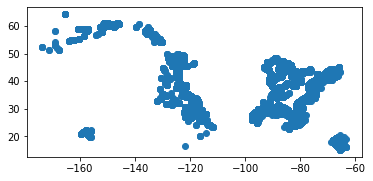

In [16]:
gpdf.plot()

In [17]:
gpdf['t'] = pd.to_datetime(gpdf['BaseDateTime'], format='%Y-%m-%dT%H:%M:%S')

In [18]:
gpdf = gpdf.set_index('t')

<AxesSubplot:>

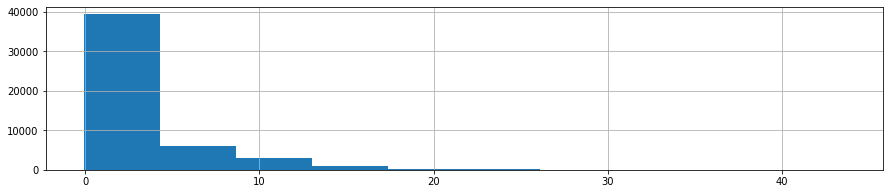

In [19]:
gpdf['SOG'].hist(bins=10, figsize=(15, 3))

Original size: 50000 rows
Reduced to 20940 rows after removing 0 speed records


<AxesSubplot:>

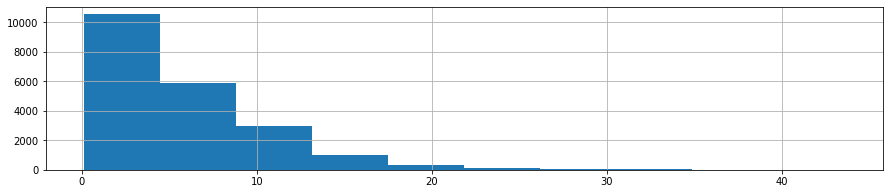

In [20]:
print("Original size: {} rows".format(len(gpdf)))
gpdf = gpdf[gpdf.SOG>0]
print("Reduced to {} rows after removing 0 speed records".format(len(gpdf)))
gpdf['SOG'].hist(bins=10, figsize=(15,3))

<AxesSubplot:>

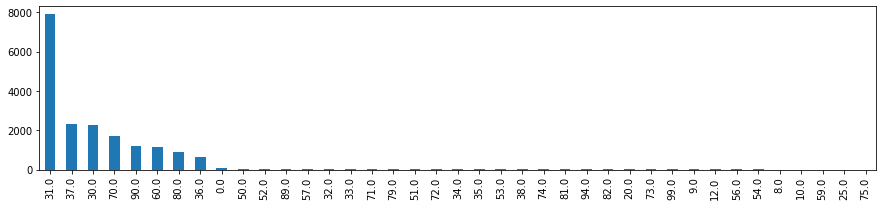

In [21]:
gpdf['VesselType'] = gpdf['VesselType'].astype(float)
gpdf['VesselType'].value_counts().plot(kind='bar', figsize=(15,3))

In [22]:
%%time
MIN_LENGTH = 0.02 # degrees - May need to reproject to use meters
traj_collection = mpd.TrajectoryCollection(gpdf, 'MMSI', min_length=MIN_LENGTH)
print("Finished creating {} trajectories".format(len(traj_collection)))

Finished creating 550 trajectories
Wall time: 15.5 s


In [23]:
traj_collection = mpd.MinTimeDeltaGeneralizer(traj_collection).generalize(tolerance=timedelta(minutes=1))
# this is looking for a specific 't' index

<AxesSubplot:>

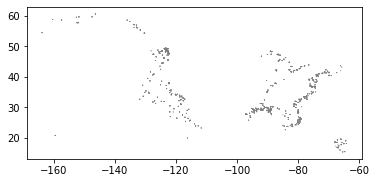

In [24]:
shiptype_to_color = {'Passenger': 'blue', 'HSC': 'green', 'Tanker': 'red', 'Cargo': 'orange'}
# Should be changed to map to these codes: https://coast.noaa.gov/data/marinecadastre/ais/VesselTypeCodes2018.pdf
traj_collection.plot(column='VesselType', column_to_color=shiptype_to_color, linewidth=1, capstyle='round')

In [25]:
passenger = traj_collection
passenger.hvplot(title='Passenger ferries', line_width=2)

.Path.CLI         :Path   [Longitude,Latitude]
   .Path.CLII        :Path   [Longitude,Latitude]
   .Path.CLIII       :Path   [Longitude,Latitude]
   .Path.CLIV        :Path   [Longitude,Latitude]
   .Path.CLV         :Path   [Longitude,Latitude]
   .Path.CLVI        :Path   [Longitude,Latitude]
   .Path.CLVII       :Path   [Longitude,Latitude]
   .Path.CLVIII      :Path   [Longitude,Latitude]
   .Path.CLIX        :Path   [Longitude,Latitude]
   .Path.CLX         :Path   [Longitude,Latitude]
   .Path.CLXI        :Path   [Longitude,Latitude]
   .Path.CLXII       :Path   [Longitude,Latitude]
   .Path.CLXIII      :Path   [Longitude,Latitude]
   .Path.CLXIV       :Path   [Longitude,Latitude]
   .Path.CLXV        :Path   [Longitude,Latitude]
   .Path.CLXVI       :Path   [Longitude,Latitude]
   .Path.CLXVII      :Path   [Longitude,Latitude]
   .Path.CLXVIII     :Path   [Longitude,Latitude]
   .Path.CLXIX       :Path   [Longitude,Latitude]
   .Path.CLXX        :Path   [Longitude,Latitude]
   .Path.CLXXI       :Path   [Longitude,Latitude]
   .Path.CLXXII      :Path   [Longitude,Latitude]
   .Path.CLXXIII     :Path   [Longitude,Latitude]
   .Path.CLXXIV      :Path   [Longitude,Latitude]
   .Path.CLXXV       :Path   [Longitude,Latitude]
   .Path.CLXXVI      :Path   [Longitude,Latitude]
   .Path.CLXXVII     :Path   [Longitude,Latitude]
   .Path.CLXXVIII    :Path   [Longitude,Latitude]
   .Path.CLXXIX      :Path   [Longitude,Latitude]
   .Path.CLXXX       :Path   [Longitude,Latitude]
   .Path.CLXXXI      :Path   [Longitude,Latitude]
   .Path.CLXXXII     :Path   [Longitude,Latitude]
   .Path.CLXXXIII    :Path   [Longitude,Latitude]
   .Path.CLXXXIV     :Path   [Longitude,Latitude]
   .Path.CLXXXV      :Path   [Longitude,Latitude]
   .Path.CLXXXVI     :Path   [Longitude,Latitude]
   .Path.CLXXXVII    :Path   [Longitude,Latitude]
   .Path.CLXXXVIII   :Path   [Longitude,Latitude]
   .Path.CLXXXIX     :Path   [Longitude,Latitude]
   .Path.CXC         :Path   [Longitude,Latitude]
   .Path.CXCI        :Path   [Longitude,Latitude]
   .Path.CXCII       :Path   [Longitude,Latitude]
   .Path.CXCIII      :Path   [Longitude,Latitude]
   .Path.CXCIV       :Path   [Longitude,Latitude]
   .Path.CXCV        :Path   [Longitude,Latitude]
   .Path.CXCVI       :Path   [Longitude,Latitude]
   .Path.CXCVII      :Path   [Longitude,Latitude]
   .Path.CXCVIII     :Path   [Longitude,Latitude]
   .Path.CXCIX       :Path   [Longitude,Latitude]
   .Path.CC          :Path   [Longitude,Latitude]
   .Path.CCI         :Path   [Longitude,Latitude]
   .Path.CCII        :Path   [Longitude,Latitude]
   .Path.CCIII       :Path   [Longitude,Latitude]
   .Path.CCIV        :Path   [Longitude,Latitude]
   .Path.CCV         :Path   [Longitude,Latitude]
   .Path.CCVI        :Path   [Longitude,Latitude]
   .Path.CCVII       :Path   [Longitude,Latitude]
   .Path.CCVIII      :Path   [Longitude,Latitude]
   .Path.CCIX        :Path   [Longitude,Latitude]
   .Path.CCX         :Path   [Longitude,Latitude]
   .Path.CCXI        :Path   [Longitude,Latitude]
   .Path.CCXII       :Path   [Longitude,Latitude]
   .Path.CCXIII      :Path   [Longitude,Latitude]
   .Path.CCXIV       :Path   [Longitude,Latitude]
   .Path.CCXV        :Path   [Longitude,Latitude]
   .Path.CCXVI       :Path   [Longitude,Latitude]
   .Path.CCXVII      :Path   [Longitude,Latitude]
   .Path.CCXVIII     :Path   [Longitude,Latitude]
   .Path.CCXIX       :Path   [Longitude,Latitude]
   .Path.CCXX        :Path   [Longitude,Latitude]
   .Path.CCXXI       :Path   [Longitude,Latitude]
   .Path.CCXXII      :Path   [Longitude,Latitude]
   .Path.CCXXIII     :Path   [Longitude,Latitude]
   .Path.CCXXIV      :Path   [Longitude,Latitude]
   .Path.CCXXV       :Path   [Longitude,Latitude]
   .Path.CCXXVI      :Path   [Longitude,Latitude]
   .Path.CCXXVII     :Path   [Longitude,Latitude]
   .Path.CCXXVIII    :Path   [Longitude,Latitude]
   .Path.CCXXIX      :Path   [Longitude,Latitude]
   .Path.CCXXX       :Path   [Longitude,Latitude]
   